## Content <a id='content'></a>

[Introduction](#intro)

[Dataset](#datasets)

[Data preprocessing](#prep)

[Data analysis](#da)

[Conclusions](#conclusions)

# Introduction <a id='intro'></a>

I work at a startup that sells food products and my task is to investigate user behavior for the company's app. To this end, we will study the quality of an app in general, and then deep down into analyzing one of the experiments which had been run at the same period of time. Thus, our project will include two major steps:

1. First we will study the sales funnel. **Our goal at this step is to find out how users reach the purchase stage**:
- How many users actually make it to this stage?
- How many get stuck at previous stages?
- Which stages in particular do users get stuck at?

2. Then we will look at the results of an A/A/B test. The reason for that is that the designers would like to change the fonts for the entire app, but the managers are afraid the users might find the new design intimidating. They decide to make a decision based on the results of an A/A/B test: the users are split into three groups - two control groups get the old fonts and one test group gets the new ones. **Our goal at this step is to find out which set of fonts produces better results**.

NOTE: Creating two A groups has certain advantages. If we make it a principle that we will only be confident in the accuracy of our testing when the two control groups are similar, then in case there are significant differences between the A groups, we will be able to uncover factors that may be distorting the results. Comparing control groups also tells us how much time and data we'll need when running further tests.

# Dataset <a id='datasets'></a>

At our disposal, we have an event log. Each log entry is a user action or an event:

- `EventName` — event name;
- `DeviceIDHash` — unique user identifier;
- `EventTimestamp` — event time;
- `ExpId` — experiment number: 246 and 247 are the control groups, 248 is the test group.

# Data preprocessing <a id='prep'></a>

In this part, we will upload the data and perform basic preprocessing procedures, like:

- Rename the columns;
- Check for missing values and data types and correct the data if needed;
- Add a date and time column and a separate column for dates.

### Libraries

Let's load the libraries we might need:

In [ ]:
#!pip install cufflinks

In [2]:
# Loading the libraries

import numpy as np
import pandas as pd
import datetime as dt

import re

import matplotlib.pyplot as plt # We will need this for visualisations
%matplotlib inline
import seaborn as sns

# Standard plotly imports
import plotly.graph_objs as go

# We can use Plotly directly with Pandas dataframes using another library named Cufflinks
from plotly.offline import iplot, init_notebook_mode# Using plotly + cufflinks in offline mode
import cufflinks as cf
cf.go_offline(connected=True)
init_notebook_mode(connected=True)

from scipy import stats as st # We will need this in case we want to make some statistical checks
import math as mth


# To filter out automatic comments on plots from Jupyter (not affecting the output)
import warnings
warnings.filterwarnings("ignore") 

[Back to Content](#content)

### File upload

We will use a `load()` function to avoid potential problems with the file pathes.

In [3]:
# function `load` for a csv load with try-except and a number of rows limit
def load(filename, sep = ','):
    """
    i=In addition to the file name, the function takes nrow parameter
    for a particular number of rows to load. If None, then the file is loaded fully.
    """
    try:
        df_raw = pd.read_csv(filename, sep = sep)
    except:
        df_raw = pd.read_csv('/'+filename, sep = sep)
    return df_raw

In [4]:
event_log = load('datasets/logs_exp_us.csv')

Let's look into the files:

In [5]:
event_log.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244126 entries, 0 to 244125
Data columns (total 1 columns):
 #   Column                                       Non-Null Count   Dtype 
---  ------                                       --------------   ----- 
 0   EventName	DeviceIDHash	EventTimestamp	ExpId  244126 non-null  object
dtypes: object(1)
memory usage: 25.4 MB


In [6]:
event_log.head()

,EventName\tDeviceIDHash\tEventTimestamp\tExpId
0,MainScreenAppear\t4575588528974610257\t1564029...
1,MainScreenAppear\t7416695313311560658\t1564053...
2,PaymentScreenSuccessful\t3518123091307005509\t...
3,CartScreenAppear\t3518123091307005509\t1564054...
4,PaymentScreenSuccessful\t6217807653094995999\t...


OK, we see that the data has been read incorrectly. Let's fix it.

In [7]:
event_log = load('datasets/logs_exp_us.csv', sep = "\t")

Let's take a look:

In [8]:
event_log.head()

,EventName,DeviceIDHash,EventTimestamp,ExpId
0,MainScreenAppear,4575588528974610257,1564029816,246
1,MainScreenAppear,7416695313311560658,1564053102,246
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248
3,CartScreenAppear,3518123091307005509,1564054127,248
4,PaymentScreenSuccessful,6217807653094995999,1564055322,248


Let's check the duplicates:

In [9]:
event_log.duplicated().sum()

413

OK, there are some, so we have to drop them:

In [10]:
event_log = event_log.drop_duplicates()

In [11]:
event_log.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243713 entries, 0 to 244125
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   EventName       243713 non-null  object
 1   DeviceIDHash    243713 non-null  int64 
 2   EventTimestamp  243713 non-null  int64 
 3   ExpId           243713 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 24.7 MB


So, we have 243713 (after dropping explicit 413 duplicates) entries in the dataset and we have already got answer with regard to the missing values and data types: no missing values, event timestamp should be corrected, but first let's rename the columns:

In [12]:
event_log.rename(columns = {'EventName': 'event_name',
                            'DeviceIDHash': 'device_id',
                            'EventTimestamp': 'event_ts',
                            'ExpId': 'experiment_id'}, inplace = True)

In [13]:
event_log.head()

,event_name,device_id,event_ts,experiment_id
0,MainScreenAppear,4575588528974610257,1564029816,246
1,MainScreenAppear,7416695313311560658,1564053102,246
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248
3,CartScreenAppear,3518123091307005509,1564054127,248
4,PaymentScreenSuccessful,6217807653094995999,1564055322,248


Great, let's fix the timestamp data type. First, let's choose some `device_id` to review its log and to figure out what the these numbers in the `event_ts` column mean:

In [14]:
event_log[event_log['device_id'] == 3518123091307005509].head(10)

,event_name,device_id,event_ts,experiment_id
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248
3,CartScreenAppear,3518123091307005509,1564054127,248
13406,MainScreenAppear,3518123091307005509,1564653802,248
13408,CartScreenAppear,3518123091307005509,1564653806,248
13409,PaymentScreenSuccessful,3518123091307005509,1564653806,248
13410,MainScreenAppear,3518123091307005509,1564653806,248
13415,OffersScreenAppear,3518123091307005509,1564653816,248
13421,CartScreenAppear,3518123091307005509,1564653824,248
13425,PaymentScreenSuccessful,3518123091307005509,1564653829,248
13428,CartScreenAppear,3518123091307005509,1564653830,248


Looks like it is reasonable to assume that those should be seconds, let's try:

In [15]:
event_log['event_ts'] =  pd.to_timedelta(event_log['event_ts'], unit='s')

In [16]:
event_log['event_ts'] = event_log['event_ts'] + pd.to_datetime('1970-01-01 00:00:00')

In [17]:
event_log[event_log['device_id'] == 3518123091307005509].head(20)

,event_name,device_id,event_ts,experiment_id
2,PaymentScreenSuccessful,3518123091307005509,2019-07-25 11:28:47,248
3,CartScreenAppear,3518123091307005509,2019-07-25 11:28:47,248
13406,MainScreenAppear,3518123091307005509,2019-08-01 10:03:22,248
13408,CartScreenAppear,3518123091307005509,2019-08-01 10:03:26,248
13409,PaymentScreenSuccessful,3518123091307005509,2019-08-01 10:03:26,248
13410,MainScreenAppear,3518123091307005509,2019-08-01 10:03:26,248
13415,OffersScreenAppear,3518123091307005509,2019-08-01 10:03:36,248
13421,CartScreenAppear,3518123091307005509,2019-08-01 10:03:44,248
13425,PaymentScreenSuccessful,3518123091307005509,2019-08-01 10:03:49,248
13428,CartScreenAppear,3518123091307005509,2019-08-01 10:03:50,248


The result looks reasonable. Let's add a separate column for dates.

In [18]:
event_log['event_date'] = event_log['event_ts'].dt.date

In [19]:
event_log.head()

,event_name,device_id,event_ts,experiment_id,event_date
0,MainScreenAppear,4575588528974610257,2019-07-25 04:43:36,246,2019-07-25
1,MainScreenAppear,7416695313311560658,2019-07-25 11:11:42,246,2019-07-25
2,PaymentScreenSuccessful,3518123091307005509,2019-07-25 11:28:47,248,2019-07-25
3,CartScreenAppear,3518123091307005509,2019-07-25 11:28:47,248,2019-07-25
4,PaymentScreenSuccessful,6217807653094995999,2019-07-25 11:48:42,248,2019-07-25


To sum up:
    
- We have uploaded the data (with the `\t` separator);
- Found and dropped 413 duplicated entries;
- Checked the data for column names, missing values and data types;
- Fixed the column names;
- Fixed the date and time column type and value representation;
- Added the `event_date` column for the purpose of the further analysis.

Let's proceed to the following step, review the data itself.

[Back to Content](#content)

### Data review

At this point, we are interested in answering the following questions:

- What period of time does the data cover?
- How many events are in the logs?
- How many users are in the logs? (Actually we will have to employ devices as a proxy to users)
- What's the average number of events per user?
- How many users are there in each of the three experimental groups?

Let's proceed one by one.

**The time period:**

In [20]:
print(event_log['event_date'].min(),event_log['event_date'].max())

2019-07-25 2019-08-07


OK, we are dealing with the data on a two-week period. Let's check how the events are distributed by dates:

In [21]:
title='Distribution of the number of events by dates'
layout = cf.Layout(
    height=400,
    width=990,
    yaxis=dict(
        title='Number of events', title_standoff = 0
    ),
    title = title, title_y = 0.8)

event_log['event_date'].iplot(kind='hist',
                          yTitle='Count',
                          color = '#6e7f29', layout = layout, 
                          bins = 200)

OK, it is obvious now, that actually the data covers one week Aug 1 to Aug 7. Looks like the week before that there some technical details had been checked, let's check how many devices will be dropped and cut the corresponding entries.

Let's state the cut off date:

In [22]:
cutoff_date = pd.to_datetime('2019-07-31 23:59:59')

Let's define two lists: one of the devices which will be **presumably** cut off and another one, of the devices which will be definetely kept.

In [23]:
devices_candidates = list(event_log.query("event_date <= @cutoff_date")['device_id'].value_counts().index)
len(devices_candidates)

1451

In [24]:
devices_kept_list = list(event_log.query("event_date > @cutoff_date")['device_id'].value_counts().index)
len(devices_kept_list)

7534

Let's check out their intersection:

In [25]:
devices_crossed_out = []

for device in devices_candidates:
    if device not in devices_kept_list:
         devices_crossed_out.append(device)

In [26]:
len(devices_crossed_out)

17

Thus, actually we are loosing **17 devices only** (~ 0.2%). Now we can cut the questionable data period:

**The number of events covered:**

In [27]:
event_log = event_log.query("event_date > @cutoff_date")

Let's check how many events we have lost:

In [28]:
len(event_log)

240887

240887 vs. 243713; i.e. from the event count angle, we have lost 2826 events, 1.16% of the initial dataset.

Let's check out their distribution by types as well:

In [29]:
event_log['event_name'].value_counts()

MainScreenAppear           117328
OffersScreenAppear          46333
CartScreenAppear            42303
PaymentScreenSuccessful     33918
Tutorial                     1005
Name: event_name, dtype: int64

In [30]:
event_log['event_name'].value_counts(normalize = True)

MainScreenAppear           0.487067
OffersScreenAppear         0.192343
CartScreenAppear           0.175613
PaymentScreenSuccessful    0.140805
Tutorial                   0.004172
Name: event_name, dtype: float64

We have **240887 events** of five types in this log; 49% of the events are main screen appearance.

**The number of users covered:**

In [31]:
event_log['device_id'].nunique()

7534

We have **7534 different devices** covered and we will asusme that the number of devices are a reasonable proxy to the number of users.

**The average number of events per user:**

In [32]:
event_device_stats = event_log.groupby(by = 'device_id').agg(
                    {'device_id': 'min', 'event_name': 'count'}).sort_values(
                        by = 'event_name', ascending = False).reset_index(drop = True)

In [33]:
event_device_stats.describe()

,device_id,event_name
count,7.534000e+03,7534.000000
mean,4.675799e+18,31.973321
std,2.655166e+18,65.090307
min,6.888747e+15,1.000000
25%,2.397148e+18,9.000000
50%,4.686286e+18,19.000000
75%,7.006700e+18,37.000000
max,9.222603e+18,2307.000000


In [34]:
title='Distribution of the number of events by devices'
layout = cf.Layout(
    height=400,
    width=990,
    yaxis=dict(
        title='Number of events', title_standoff = 0),
    title = title, title_y = 0.8)

event_device_stats['event_name'].iplot(kind='hist',
                          xTitle='Number of events', yTitle='Count',
                          color = '#6e7f29', layout = layout, 
                          bins = 200)

Thus, there are **32 events on average per user (device)**, while the median equals 20 and 75% of the users create less than 38 events. Let's count how many devices there are which generate 350 and more events:

In [35]:
event_device_stats[event_device_stats['event_name'] >= 350].count()

device_id     28
event_name    28
dtype: int64

28 devices generate 350 and more events. Let's save the list of their `device_id`'s:

In [36]:
too_many_events_devices = event_device_stats[event_device_stats['event_name'] >= 350]['device_id'].to_list()

Before we exclude them, let's check whether there are devices that generated some unreasonable number of successful purchase events:

In [37]:
purchase_event_device_stats = event_log[event_log['event_name'] == 'PaymentScreenSuccessful'].groupby(
                    by = 'device_id').agg(
                    {'device_id': 'min', 'event_name': 'count'}).sort_values(
                        by = 'event_name', ascending = False).reset_index(drop = True)

In [38]:
purchase_event_device_stats.describe()

,device_id,event_name
count,3.539000e+03,3539.000000
mean,4.720194e+18,9.584063
std,2.645737e+18,36.730920
min,6.909562e+15,1.000000
25%,2.508737e+18,2.000000
50%,4.734460e+18,4.000000
75%,7.013876e+18,8.000000
max,9.219464e+18,1085.000000


In [39]:
title='Distribution of the number of purchase events by devices'
layout = cf.Layout(
    height=400,
    width=990,
    yaxis=dict(
        title='Number of events', title_standoff = 0),
    title = title, title_y = 0.8)

purchase_event_device_stats['event_name'].iplot(kind='hist',
                          xTitle='Number of events', yTitle='Count',
                          color = '#6e7f29', layout = layout, 
                          bins = 200)

Let's suppose that 70 purchases in a week is really extravagant: in any case, we cannot say that those users who performed so many purchases represent the population in general.

In [40]:
too_many_purchase_events_devices = purchase_event_device_stats[
                    purchase_event_device_stats['event_name'] >= 70]['device_id'].to_list()

In [41]:
len(too_many_purchase_events_devices)

49

Thus, there are 49 devices that generated more than 70 purchases. Let's check how many events were generated from these devices:

In [42]:
event_log.query('device_id in @too_many_purchase_events_devices')['event_name'].count() * 100 / event_log['event_name'].count()

11.366325289451071

Hm...sounds disturbing, 11.4% of all events were generated by 49 devices (less than 0.7% of the total number of devices). 

Let's perform a couple of other short checks:

In [43]:
counter = 0
for did in too_many_events_devices:
    if did in too_many_purchase_events_devices:
        counter += 1
        
print(counter)

26


This means that 26 out of 28 devices that generated 350 events and more are also those that generated 70 and more purchases, sounds reasonable actually.

In [44]:
event_log.query('device_id in @too_many_purchase_events_devices')['experiment_id'].value_counts()

248    12069
246     8915
247     6396
Name: experiment_id, dtype: int64

The event traffic from the unproportionally active devices is significantly higher in the test group, if not the level of that activity of 10 and more purchases per day, it could even serve as an indication to possible success of the new fonts.

Let's perform one last check, make sure that we have approximatelly equal number of users in each of the testing groups.

In [45]:
event_log.groupby(by = 'experiment_id').agg(
                    {'experiment_id': 'min', 'device_id': 'nunique'}).sort_values(
                        by = 'device_id', ascending = False).reset_index(drop = True)

,experiment_id,device_id
0,248,2537
1,247,2513
2,246,2484


Let's add some visuals:

In [46]:
group_device_stats = event_log.groupby(
                    by = 'device_id').agg(
                    {'experiment_id': 'min', 'device_id': 'min', 'event_name': 'count'}).sort_values(
                        by = 'event_name', ascending = False).reset_index(drop = True)

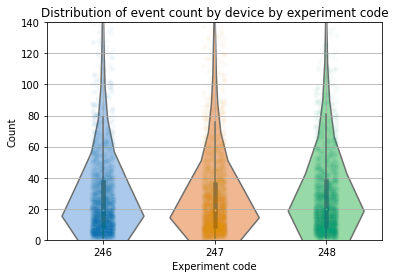

In [47]:
sns.violinplot(x="experiment_id", y="event_name", data=group_device_stats, palette='pastel')
sns.stripplot(x="experiment_id", y="event_name", data=group_device_stats, palette='colorblind', alpha = 0.03)
plt.ylim(0,140)
plt.grid()
plt.ylabel("Count")
plt.title("Distribution of event count by device by experiment code")
plt.xlabel("Experiment code")
plt.show()

One can note, that the test group has slightly higher number of devices than the control groups; however, the difference is around 2%. The distribution of the number of events by devices for each group have some minor differences.

To sum up:

- We have checked what the time period is covered by the dataset; it turned out that the initial data covers 2 weeks, starting from Jul 25, but the first week represented 1.16% of the data only and seemed to be technical; thus, we have cleaned the dataset and left with a set of 241298 entries for one week, Ayg 1, 2019 to Aug 7, 2019;
- We have learned that there are five types of events in the dataset and 49% of them are main page views;
- Those 241298 events were generated by 7534 devices; we had to assume that the number of devices is a good proxy to the number of users;
- The event distribution is non-normal with 32 events on average for a device, while the median number of the events per device equals 19;
- Appr. 50 users (less than 0.7%) performed more than 70 purchases in the week of the data sample; what seems to deserve additional attention, they generated 11.4% of the total number of events;
- The test group (248) has slightly higher number of devices thaN the control groups; however, the difference is around 2%. The distribution of the number of events by devices for each group have some minor differences.

[Back to Content](#content)

# Data Analysis <a id='da'></a>

### Part 1. Study of the event funnel

We have already seen the events in the logs and their frequency of occurrence:

In [48]:
event_log['event_name'].value_counts(normalize = True)

MainScreenAppear           0.487067
OffersScreenAppear         0.192343
CartScreenAppear           0.175613
PaymentScreenSuccessful    0.140805
Tutorial                   0.004172
Name: event_name, dtype: float64

Find the number of users who performed each of the actions:

In [49]:
funnel = event_log['event_name'].value_counts()

Let's visualise it to illustrate the absolute values and the proportions, as well as the share of users that proceed from each stage to the next (see the hover). We should note, that, obviously, we cannot include reading the tutorial as the last step of the funnel, since it can happen at any step; besides, a very tiny amount of users read it actualy, which can be a study case on its own. On the other hand, we should be careful as well, about the `OfferScreenAppear` event: seemingly, an offer screen can be part of the user jorney both before the cart screen and after. As one of the options, we need to devide the users into those who first received an offer screen and then proceeded to the cart and those who received an offer screen after adding at least one product to the cart. There can be other scenario as well. Let's first consider the basic funnel consisting of the main scree, the cart and the purchase success screen.

In [50]:
basic_funnel_steps = ['MainScreenAppear', 'CartScreenAppear', 'PaymentScreenSuccessful']

In [51]:
basic_funnel = event_log.query('event_name in @basic_funnel_steps').pivot_table(
                    index = 'event_name',
                    values = 'device_id',
                    aggfunc = 'nunique').sort_values(by = 'device_id', ascending = False)

In [52]:
basic_funnel

,device_id
event_name,
MainScreenAppear,7419
CartScreenAppear,3734
PaymentScreenSuccessful,3539


In [53]:
from plotly import graph_objects as go

fig = go.Figure(go.Funnel(
    y = basic_funnel_steps,
    x = basic_funnel['device_id'],
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]},
    ))

# fig.update_traces(legendgrouptitle=dict(text = "Basic event funnel"),
                  #selector=dict(type='funnel'))

fig.show()

Almost 50% users are lost before moving to the cart, while 95% of those who started building a cart proceeded with the paymnet. Close to 48% of users make the entire journey from their first event to payment.

In [54]:
# the reviewer's code:

fig = go.Figure(go.Funnel(
    y = basic_funnel_steps,
    x = basic_funnel['device_id'],
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]},
    ))
fig.update_layout(
    title={ 'text': "The funnel",
            'y':0.85, 'x':0.0,
            'xanchor': 'left',
            'yanchor': 'top'},
)
fig.show()

[Back to Content](#content)

Now, let's try to investigate the user jorneys in a bit more details. We will leave out the tutorial events as having too low count.

In [55]:
first_main_screen_date_by_device = event_log[event_log['event_name']=='MainScreenAppear'].groupby('device_id')['event_ts'].min()
first_offer_screen_date_by_device = event_log[event_log['event_name']=='OffersScreenAppear'].groupby('device_id')['event_ts'].min()
first_cart_screen_date_by_device = event_log[event_log['event_name']=='CartScreenAppear'].groupby('device_id')['event_ts'].min()
first_payment_date_by_device = event_log[event_log['event_name']=='PaymentScreenSuccessful'].groupby('device_id')['event_ts'].min()

In [56]:
first_main_screen_date_by_device.name = 'first_main_ts'
first_offer_screen_date_by_device.name = 'first_offer_ts'
first_cart_screen_date_by_device.name = 'first_cart_ts'
first_payment_date_by_device.name = 'first_payment_ts'

Let's construct user (device) profiles:

In [57]:
profiles = pd.DataFrame(first_main_screen_date_by_device)
profiles = profiles.join(first_offer_screen_date_by_device,on='device_id')

Let's have a look:

In [58]:
profiles.head()

,first_main_ts,first_offer_ts
device_id,,
6888746892508752,2019-08-06 14:06:34,NaT
6909561520679493,2019-08-06 18:52:54,2019-08-06 18:53:04
6922444491712477,2019-08-04 14:19:33,2019-08-04 14:19:46
7435777799948366,2019-08-05 08:06:34,NaT
7702139951469979,2019-08-01 04:29:54,2019-08-01 04:29:56


Great, let's join it with the first cart dates and first payment dates:

In [59]:
profiles= profiles.join(first_cart_screen_date_by_device,on='device_id')
profiles= profiles.join(first_payment_date_by_device,on='device_id')

In [60]:
len(profiles)

7419

Thus, we have arranged user jorney data for 7419 devices. Let's see how many of them have `first_main_date` before `first_offer_date`:

In [61]:
uj1 = profiles[profiles['first_offer_ts'] < profiles['first_main_ts']]

In [62]:
len(uj1)

280

OK, only 280 of them, so it looks like a technical issue of the dataset starting date; let's check what dates we are talking about:

In [63]:
uj1['first_offer_date'] = uj1['first_offer_ts'].dt.date
uj1['first_main_date'] = uj1['first_main_ts'].dt.date

In [64]:
uj1_pivot = uj1.pivot_table(index = 'first_offer_date',
                columns = 'first_main_date',
                values = 'first_main_ts',
                aggfunc = 'count')

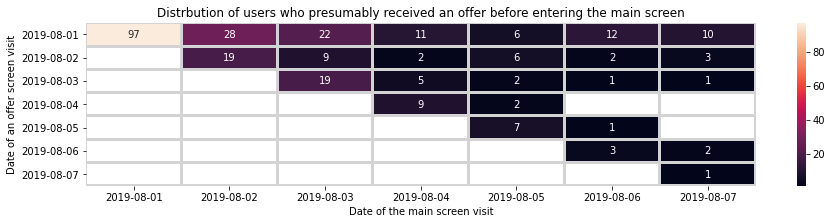

In [65]:
plt.figure(figsize=(15, 3))
plt.title('Distrbution of users who presumably received an offer before entering the main screen')
sns.heatmap(
    uj1_pivot,
    annot=True,
    fmt='.0f',
    linewidths=2,
    linecolor='lightgray',
)
plt.xlabel('Date of the main screen visit')
plt.ylabel('Date of an offer screen visit')
plt.show()

We see that a significant share of the users both received the offer and entered the main sceen on the first day of the experiment. Given that we have cut the previous data it can be the case, that actually those users entered the main screen before getting to the offer. Anyway, the `uj1` sample is too small, so we can focus on the primary version of the beginning of user journey: first the main screen, then the offer OR just the main screen:

In [66]:
profiles = profiles[(profiles['first_offer_ts'] >= profiles['first_main_ts']) | (profiles['first_offer_ts'].isna())]

In [67]:
profiles.head(10)

,first_main_ts,first_offer_ts,first_cart_ts,first_payment_ts
device_id,,,,
6888746892508752,2019-08-06 14:06:34,NaT,NaT,NaT
6909561520679493,2019-08-06 18:52:54,2019-08-06 18:53:04,2019-08-06 18:52:58,2019-08-06 18:52:58
6922444491712477,2019-08-04 14:19:33,2019-08-04 14:19:46,2019-08-04 14:19:40,2019-08-04 14:19:40
7435777799948366,2019-08-05 08:06:34,NaT,NaT,NaT
7702139951469979,2019-08-01 04:29:54,2019-08-01 04:29:56,2019-08-02 14:28:45,2019-08-02 14:28:45
8740973466195562,2019-08-02 09:16:48,2019-08-02 09:43:59,NaT,NaT
9841258664663090,2019-08-03 10:47:59,2019-08-03 10:49:42,2019-08-03 10:52:15,2019-08-03 17:57:27
12692216027168046,2019-08-02 16:28:49,2019-08-05 04:06:02,NaT,NaT
20449203507642281,2019-08-06 21:04:21,NaT,NaT,NaT


In the same manner, let's check how many of the users have the first main screen visit *after* the first cart screen (which apperently means, again, that some of the data was cut):

In [68]:
uj2 = profiles[profiles['first_cart_ts'] < profiles['first_main_ts']]

In [69]:
len(uj2)

46

OK, this looks like the same issue; thus, we have to clean up the data from these cases as well:

In [70]:
profiles = profiles[(profiles['first_cart_ts'] >= profiles['first_main_ts']) | (profiles['first_cart_ts'].isna())]

In [71]:
profiles.head(10)

,first_main_ts,first_offer_ts,first_cart_ts,first_payment_ts
device_id,,,,
6888746892508752,2019-08-06 14:06:34,NaT,NaT,NaT
6909561520679493,2019-08-06 18:52:54,2019-08-06 18:53:04,2019-08-06 18:52:58,2019-08-06 18:52:58
6922444491712477,2019-08-04 14:19:33,2019-08-04 14:19:46,2019-08-04 14:19:40,2019-08-04 14:19:40
7435777799948366,2019-08-05 08:06:34,NaT,NaT,NaT
7702139951469979,2019-08-01 04:29:54,2019-08-01 04:29:56,2019-08-02 14:28:45,2019-08-02 14:28:45
8740973466195562,2019-08-02 09:16:48,2019-08-02 09:43:59,NaT,NaT
9841258664663090,2019-08-03 10:47:59,2019-08-03 10:49:42,2019-08-03 10:52:15,2019-08-03 17:57:27
12692216027168046,2019-08-02 16:28:49,2019-08-05 04:06:02,NaT,NaT
20449203507642281,2019-08-06 21:04:21,NaT,NaT,NaT


The last one, the logic of the first payment timestamp:

In [72]:
# checking that the payment included a visit of the main page beforehand
uj3= profiles[profiles['first_payment_ts'] < profiles['first_main_ts']]

In [73]:
len(uj3)

3

In [74]:
profiles = profiles[(profiles['first_payment_ts'] >= profiles['first_main_ts']) | (profiles['first_payment_ts'].isna())]

In [75]:
# checking that the payment included a visit of the cart page beforehand
uj4= profiles[profiles['first_payment_ts'] < profiles['first_cart_ts']]

In [76]:
len(uj4)

628

In [77]:
profiles = profiles[(profiles['first_payment_ts'] >= profiles['first_cart_ts']) | (profiles['first_payment_ts'].isna())]

Let's check how many devices we have lost during the cleaning process:

In [78]:
len(profiles)

6458

We are left with 6544 vs. 7534 devices, appr. 14% lost.

Let's check make sure that their distribution by the experiment codes has not been distorted.

In [79]:
clean_device_ids = profiles.index.to_list()

In [80]:
event_log = event_log.query('device_id in @clean_device_ids')

In [81]:
len(event_log)

188189

We are left with 190977 out of 241298 events, 22% less (which means we have less excessively active devices in the current dataset as compared with the initial one).

In [82]:
event_log.groupby(by = 'experiment_id').agg(
                    {'experiment_id': 'min', 'device_id': 'nunique'}).sort_values(
                        by = 'device_id', ascending = False).reset_index(drop = True)

,experiment_id,device_id
0,248,2201
1,247,2143
2,246,2114


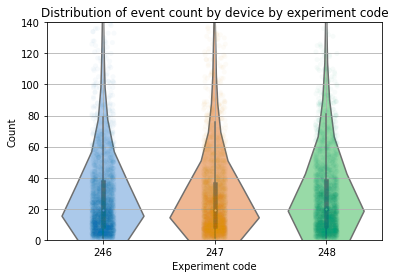

In [83]:
sns.violinplot(x="experiment_id", y="event_name", data=group_device_stats, palette='pastel')
sns.stripplot(x="experiment_id", y="event_name", data=group_device_stats, palette='colorblind', alpha = 0.03)
plt.ylim(0,140)
plt.grid()
plt.ylabel("Count")
plt.title("Distribution of event count by device by experiment code")
plt.xlabel("Experiment code")
plt.show()

OK, the distributions look similar to the initial ones.

Finally, we can check out the cleaned funnels! Let's single out the users into those who receive an offer before entering the cart and those who receive it after entering the cart (or performing the payment) OR did not receive at all:

In [84]:
offer_first_ids = profiles[(profiles['first_offer_ts'] < profiles['first_cart_ts'])].index.to_list() 
cart_first_ids = profiles[(profiles['first_offer_ts'] >= profiles['first_cart_ts']) | (profiles['first_offer_ts'].isna())].index.to_list()

In [85]:
len(offer_first_ids)

1431

In [86]:
len(cart_first_ids)

4155

In [87]:
offer_first_funnel = event_log.query('device_id in @offer_first_ids').pivot_table(
                    index = 'event_name',
                    values = 'device_id',
                    aggfunc = 'nunique').sort_values(by = 'device_id', ascending = False)

In [88]:
offer_first_funnel

,device_id
event_name,
CartScreenAppear,1431
MainScreenAppear,1431
OffersScreenAppear,1431
PaymentScreenSuccessful,1339
Tutorial,324


In [89]:
offer_first_funnel_titles = ['MainScreenAppear', 'OffersScreenAppear', 'CartScreenAppear', 'PaymentScreenSuccessful']

In [90]:
offer_first_funnel_x = []
for title in offer_first_funnel_titles:
    offer_first_funnel_x.append(offer_first_funnel.loc[title][0])

In [91]:
cart_first_funnel = event_log.query('device_id in @cart_first_ids').pivot_table(
                    index = 'event_name',
                    values = 'device_id',
                    aggfunc = 'nunique').sort_values(by = 'device_id', ascending = False)

In [92]:
cart_first_funnel

,device_id
event_name,
MainScreenAppear,4155
CartScreenAppear,1273
OffersScreenAppear,1220
PaymentScreenSuccessful,1173
Tutorial,348


In [93]:
cart_first_funnel_titles = ['MainScreenAppear', 'CartScreenAppear', 'OffersScreenAppear', 'PaymentScreenSuccessful']

In [94]:
cart_first_funnel_x = []
for title in cart_first_funnel_titles:
    cart_first_funnel_x.append(cart_first_funnel.loc[title][0])

In [95]:
# offer first funnel
from plotly import graph_objects as go

fig = go.Figure(go.Funnel(
    y = offer_first_funnel_titles,
    x = offer_first_funnel_x,
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]},
    ))
fig.show()

In [96]:
# cart first funnel
from plotly import graph_objects as go

fig = go.Figure(go.Funnel(
    y = cart_first_funnel_titles,
    x = cart_first_funnel_x, 
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]},
    ))
fig.show()

Aha! We lost 69% of those users, who do not see an offer before starting to arrange a cart. If they receive an offer afterwards, 94% of them accomplish the payment step. On the other hand, for those who receive an offer before they start arranging a cart, overall, the same 94% perform the payment; thus, only 28% of the initial sample of those who receive an offer after they start arranging a cart or do not receive at all end up accomplishing a payment as opposed to 94% of those who receive it before they start arranging a cart.

#### Stacked Funnel Plot

Let's see the two sampels together.

In [97]:
fig = go.Figure()

fig.add_trace(go.Funnel(
    name = 'Cart first',
    y = ["Main screen", "Cart screen", "Offer", "Payment"],
    x = cart_first_funnel_x,
    textinfo = "value+percent initial"))

fig.add_trace(go.Funnel(
    name = 'Offer first',
    orientation = "h",
    y = ["Main screen", "Offer", "Cart screen", "Payment"],
    x = offer_first_funnel_x,
    textposition = "inside",
    textinfo = "value+percent previous"))

fig.show()

In [98]:
# the reviewer's code: I will use the raw data:
tmp = load('datasets/logs_exp_us.csv', sep = "\t")

tmp_funnel = (tmp
       .query('EventName != "Tutorial"')
       .groupby('EventName')
       .agg({'DeviceIDHash' : 'nunique'})
       .reset_index()
       .sort_values(by = 'DeviceIDHash', ascending = False)
      )
 
tmp_funnel['overall_conv'] = tmp_funnel['DeviceIDHash'] / tmp.query('EventName != "Tutorial"')['DeviceIDHash'].nunique()
tmp_funnel['first_event_conv'] = tmp_funnel['DeviceIDHash'] / tmp.query('EventName == "MainScreenAppear"')['DeviceIDHash'].nunique()
tmp_funnel['prev_conv'] = (1 + tmp_funnel['DeviceIDHash'].pct_change())

tmp_funnel

,EventName,DeviceIDHash,overall_conv,first_event_conv,prev_conv
1,MainScreenAppear,7439,0.985690,1.000000,NaN
2,OffersScreenAppear,4613,0.611236,0.620110,0.620110
0,CartScreenAppear,3749,0.496754,0.503966,0.812703
3,PaymentScreenSuccessful,3547,0.469988,0.476811,0.946119


In [99]:
# the reviewer's code: I will use the raw data:
fig = go.Figure()
fig.add_trace(go.Funnel(
    y = tmp_funnel['EventName'],
    x = tmp_funnel['DeviceIDHash'],
    textinfo = "value+percent initial+percent previous"))
fig.update_layout(
    title={ 'text': "Simple product funnel",
            'y':0.85, 'x':0.0,
            'xanchor': 'left',
            'yanchor': 'top'},
)

fig.show()

To sum up:
  
- We have initial analysis of a basic, three-step, funnel and concluded that almost 50% users are lost before moving to the cart, while 95% of those who started building a cart proceeded with the paymnet; close to 48% of users make the entire journey from their first event to payment.;
- Then we have cleaned the `event_log` from those devices that could distort the result with artifacts, like, visiting a cart screen for the first time before entering the main screen for the first time accordingly;
- After cleaning we have singled out from the the `event_log` a subset of those devices (users) who, when interracting with the app for the first time, see an offer screen before they enter a cart screen (22%) and those who either never see an offer screen or enter it after they started to arrange a cart (64%);
- It turned out that 69% of those users, who do not see an offer before starting to arrange a cart become lost; if they see an offer afterwards, 100% of them return and enter the offer screen, and 94% of those who saw the offer screen accomplish the payment step;  only 28% of the initial sample of those who receive it after they start arranging a cart or do not receive at all end up accomplishing a payment.
- On the other hand, for those who receive an offer before they start arranging a cart, we lose only 6% at the payment stage: 94% of the initial sample of those receiveing an offer before they start arranging a cart perform the payment.
    

[Back to Content](#content)

### Part 2. Study of the results of the experiment

Let's recap on how many users are there in each group:

In [100]:
event_log.groupby(by = 'experiment_id').agg(
                    {'experiment_id': 'min', 'device_id': 'nunique'}).sort_values(
                        by = 'device_id', ascending = False).reset_index(drop = True)

,experiment_id,device_id
0,248,2201
1,247,2143
2,246,2114


The design of the experiment includes two control groups in the A/A test, where we check our mechanisms and calculations. Let's see if there is a statistically significant difference between samples `246` and `247`.

First, we will make sure that the users are unique for each experiment group:

In [101]:
gr246_ids = list(event_log[event_log['experiment_id']==246]['device_id'].value_counts().index)

In [102]:
gr247_ids = list(event_log[event_log['experiment_id']==247]['device_id'].value_counts().index)

In [103]:
gr248_ids = list(event_log[event_log['experiment_id']==248]['device_id'].value_counts().index)

In [104]:
def list_compare(lst1, lst2):
    
    tr = []

    for did in lst1:
        if did in lst2:
            tr.append(did)
    return tr
        

In [105]:
compare_list = [gr246_ids, gr247_ids, gr248_ids]
for i in range(0, len(compare_list)):
    for j in range(0, len(compare_list)):
        if compare_list[i]!=compare_list[j]:
            print(list_compare(compare_list[i], compare_list[j]))

[]
[]
[]
[]
[]
[]


No `device_id` in two groups.

In [106]:
# the reviewer's code: 
event_log.groupby('device_id').agg({'experiment_id' : 'nunique'}).query('experiment_id > 1')

,experiment_id
device_id,


#### On testing the hypothesis that Proportions Are Equal

Here we need to test hypotheses about the equality of proportions of populations. If one part of a statistical population has a certain feature while another part doesn't, we can make conclusions about the size of that proportion based on a sample taken from the population. As with the mean, for large enough samples sample proportions will be normally distributed around the actual one regardless of how the statistical population itself is distributed.


To compare the proportions of two populations based on samples from them, we calculate statistic - the difference between the proportions we observe in our samples, which should follow standard normal distribution:

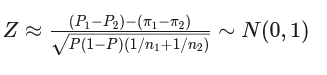


With A/B testing, the nullhypothesis is that `π₁ = π₂`,  where  `π₁` and `π₂` are the actual proportions in the populations we are comparing; `P₁` and `P₂` are the proportions observed in the samples, and `P` is the proportion in the two samples combined; `n₁` and `n₂` represent the sizes of the two samples being compared.

#### Implementing the testing on proportions

Let's try to implement this approach with the proportions of users following from the main screen to the cart screen. First, let's calculate funnels for the three groups:

In [107]:
funnel_246 = event_log.query('experiment_id == 246').pivot_table(
                    index = 'event_name',
                    values = 'device_id',
                    aggfunc = 'nunique').sort_values(by = 'device_id', ascending = False)

In [108]:
funnel_246

,device_id
event_name,
MainScreenAppear,2114
OffersScreenAppear,1175
CartScreenAppear,910
PaymentScreenSuccessful,844
Tutorial,257


In [109]:
funnel_247 = event_log.query('experiment_id == 247').pivot_table(
                    index = 'event_name',
                    values = 'device_id',
                    aggfunc = 'nunique').sort_values(by = 'device_id', ascending = False)

In [110]:
funnel_247

,device_id
event_name,
MainScreenAppear,2143
OffersScreenAppear,1151
CartScreenAppear,885
PaymentScreenSuccessful,808
Tutorial,266


In [111]:
funnel_248 = event_log.query('experiment_id == 248').pivot_table(
                    index = 'event_name',
                    values = 'device_id',
                    aggfunc = 'nunique').sort_values(by = 'device_id', ascending = False)

In [112]:
funnel_248

,device_id
event_name,
MainScreenAppear,2201
OffersScreenAppear,1197
CartScreenAppear,909
PaymentScreenSuccessful,860
Tutorial,261


Let's add the combined control funnel to it:

In [113]:
funnel_A = event_log.query('experiment_id != 248').pivot_table(
                    index = 'event_name',
                    values = 'device_id',
                    aggfunc = 'nunique').sort_values(by = 'device_id', ascending = False)

In [114]:
funnel_A

,device_id
event_name,
MainScreenAppear,4257
OffersScreenAppear,2326
CartScreenAppear,1795
PaymentScreenSuccessful,1652
Tutorial,523


Now, let's implement the test. We will take the 5% confidence level: we are going to implement a lot of testing;  thus, we will make sure that none of the results is faulty (at least, statistically).

In [115]:
alpha = .05 # significance level

successes = np.array([funnel_246.loc['OffersScreenAppear'][0], funnel_247.loc['OffersScreenAppear'][0]])
trials = np.array([funnel_246.loc['MainScreenAppear'][0], funnel_247.loc['MainScreenAppear'][0]])

# success proportion in the first group:
p1 = successes[0]/trials[0]

# success proportion in the second group:
p2 = successes[1]/trials[1]

# success proportion in the combined dataset:
p_combined = (successes[0] + successes[1]) / (trials[0] + trials[1])

# the difference between the datasets' proportions
difference = p1 - p2

In [116]:
# calculating the statistic in standard deviations of the standard normal distribution
z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials[0] + 1/trials[1]))

# setting up the standard normal distribution (mean 0, standard deviation 1)
distr = st.norm(0, 1) 

If the proportions were equal, the difference between them would be 0. Let's calculate how far from 0 our statistic turned out to be. What is the probability of getting such a difference or a greater one? Since the statistic's distribution is normal, we'll call the `cdf()` method. We'll get the absolute value of the statistic using the `abs()` method to ensure we get the right result no matter what sign the statistic has; for the same reason, we double the result.

In [117]:
p_value = (1 - distr.cdf(abs(z_value))) * 2

print('p-value: ', p_value)

if (p_value < alpha):
    print("Rejecting the null hypothesis: there is a significant difference between the proportions")
else:
    print("Failed to reject the null hypothesis: there is no reason to consider the proportions different")

p-value:  0.21992891629946754
Failed to reject the null hypothesis: there is no reason to consider the proportions different


Let's combine everything into one function:

In [118]:
def z_testing(successes, trials, alpha = .05 ):
    
    # significance level alpha = .05

    # success proportion in the first group:
    p1 = successes[0]/trials[0]

    # success proportion in the second group:
    p2 = successes[1]/trials[1]

    # success proportion in the combined dataset:
    p_combined = (successes[0] + successes[1]) / (trials[0] + trials[1])

    # the difference between the datasets' proportions
    difference = p1 - p2
    
    # calculating the statistic in standard deviations of the standard normal distribution
    z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials[0] + 1/trials[1]))

    # setting up the standard normal distribution (mean 0, standard deviation 1)
    distr = st.norm(0, 1) 
    
    p_value = (1 - distr.cdf(abs(z_value))) * 2
    
    print('p-value: ', p_value)

    if (p_value < alpha):
        print("Rejecting the null hypothesis: there is a significant difference between the proportions")
    else:
        print("Failed to reject the null hypothesis: there is no reason to consider the proportions different")

Now we can employ this function; first, we will do this for the two control groups:

In [119]:
compare_vector = ['OffersScreenAppear', 'CartScreenAppear', 'PaymentScreenSuccessful']

In [120]:
trials = np.array([funnel_246.loc['MainScreenAppear'][0], funnel_247.loc['MainScreenAppear'][0]])

for metric in compare_vector:
    successes = np.array([funnel_246.loc[metric][0], funnel_247.loc[metric][0]])
    z_testing(successes, trials)

p-value:  0.21992891629946754
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.24790041741901447
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.13721379711058557
Failed to reject the null hypothesis: there is no reason to consider the proportions different


**The result points at the fact that the two distributions are essentially identical and the groups were split correctly.**

Let's do the same with for the group with altered fonts. 

1. Control group `246`:

In [121]:
trials = np.array([funnel_248.loc['MainScreenAppear'][0], funnel_246.loc['MainScreenAppear'][0]])

for metric in compare_vector:
    successes = np.array([funnel_248.loc[metric][0], funnel_246.loc[metric][0]])
    z_testing(successes, trials)

p-value:  0.42932083177641855
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.24535699242255093
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.5674712535299107
Failed to reject the null hypothesis: there is no reason to consider the proportions different


2. Control group `247`:

In [122]:
trials = np.array([funnel_248.loc['MainScreenAppear'][0], funnel_247.loc['MainScreenAppear'][0]])

for metric in compare_vector:
    successes = np.array([funnel_248.loc[metric][0], funnel_247.loc[metric][0]])
    z_testing(successes, trials)

p-value:  0.6555528803779722
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.9988452643509957
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.3536525351950912
Failed to reject the null hypothesis: there is no reason to consider the proportions different


2. Control group `A`:

In [123]:
trials = np.array([funnel_248.loc['MainScreenAppear'][0], funnel_A.loc['MainScreenAppear'][0]])

for metric in compare_vector:
    successes = np.array([funnel_248.loc[metric][0], funnel_A.loc[metric][0]])
    z_testing(successes, trials)

p-value:  0.8453101209976848
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.5035246374813529
Failed to reject the null hypothesis: there is no reason to consider the proportions different
p-value:  0.835072117449164
Failed to reject the null hypothesis: there is no reason to consider the proportions different


**The result points at the fact that statistical difference is observed between either isolated or combined control groups and the test group.**

Since the results do not show any significant difference, it is hard to derive any meaningful conclusions, besides the need to continue the experiment. Let's calculate the aggregated cumulative daily values for two event types, main screen visits and payments, to try to clarify the picture:

In [124]:
events_log_payments = event_log[event_log['event_name'] == 'PaymentScreenSuccessful']
events_log_main = event_log[event_log['event_name'] == 'MainScreenAppear']
datesGroups = event_log[['event_date','experiment_id']].drop_duplicates()

# getting aggregated cumulative daily data on payments
paymentsAggregated = datesGroups.apply(lambda x:
                                     events_log_payments[np.logical_and(events_log_payments['event_date'] <= x['event_date'],
                                     events_log_payments['experiment_id'] == x['experiment_id'])].agg({'event_date' : 'max',
                                                                          'experiment_id' : 'max',
                                                                          'device_id' : pd.Series.nunique}),
                                     axis=1).sort_values(by=['event_date','experiment_id'])

# getting aggregated cumulative daily data on visitors  
visitorsAggregated = datesGroups.apply(lambda x:
                                       events_log_main[np.logical_and(events_log_main['event_date'] <= x['event_date'],
                                       events_log_main['experiment_id'] == x['experiment_id'])].agg({'event_date' : 'max',
                                                                             'experiment_id' : 'max',
                                                                             'device_id' : pd.Series.nunique}),
                                       axis=1).sort_values(by=['event_date','experiment_id'])

# merging the two tables into one and giving its columns descriptive names
cumulativeData = paymentsAggregated.merge(visitorsAggregated, left_on=['event_date', 'experiment_id'], right_on=['event_date', 'experiment_id'])
cumulativeData.columns = ['date', 'group', 'payments', 'visitors']

In [125]:
# check
cumulativeData[cumulativeData['group']==246]

,date,group,payments,visitors
0,2019-08-01,246,303,979
3,2019-08-02,246,499,1433
6,2019-08-03,246,617,1643
9,2019-08-04,246,700,1812
12,2019-08-05,246,760,1942
15,2019-08-06,246,810,2053
18,2019-08-07,246,844,2114


Let's plot cumulative revenue graphs by day and A/A/B test group:

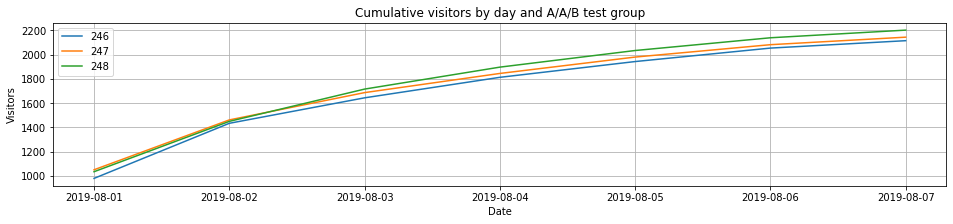

In [126]:
# DataFrame with cumulative values by day, group 246
cumulativeVisitors246 = cumulativeData[cumulativeData['group']==246][['date','payments', 'visitors']]

# DataFrame with cumulative values by day, group 247
cumulativeVisitors247 = cumulativeData[cumulativeData['group']==247][['date','payments', 'visitors']]

# DataFrame with cumulative values by day, group 248
cumulativeVisitors248 = cumulativeData[cumulativeData['group']==248][['date','payments', 'visitors']]

# Plotting the group 246 visitors graph 
plt.figure(figsize=(16, 3))

plt.plot(cumulativeVisitors246['date'], cumulativeVisitors246['visitors'], label='246')

# Plotting the group 247 visitors graph 
plt.plot(cumulativeVisitors247['date'], cumulativeVisitors247['visitors'], label='247')

# Plotting the group 248 visitors graph 
plt.plot(cumulativeVisitors248['date'], cumulativeVisitors248['visitors'], label='248')

plt.grid()

plt.ylabel("Visitors")
plt.xlabel("Date")
plt.title("Cumulative visitors by day and A/A/B test group")

plt.xticks(rotation = 0)

plt.legend()
plt.show()

Let's analyze the cumulative conversion graph. We will calculate each group's conversion rate as the ratio of payments to the number of visits for each day. Thus, we will plot and study the daily conversion rates of the three groups and describe the difference.

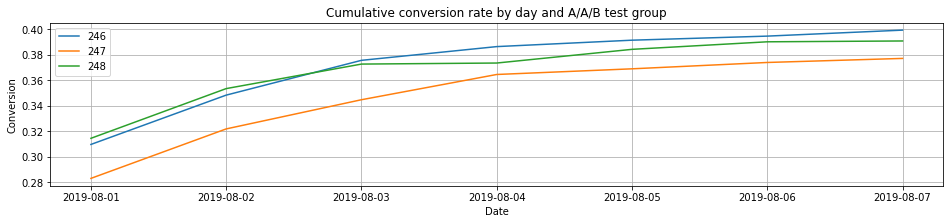

In [127]:
# calculating cumulative conversion
cumulativeData['conversion'] = cumulativeData['payments']/cumulativeData['visitors']

# selecting data on group 246 
cumulativeData246 = cumulativeData[cumulativeData['group']==246]

# selecting data on group 247 
cumulativeData247 = cumulativeData[cumulativeData['group']==247]

# selecting data on group 248 
cumulativeData248 = cumulativeData[cumulativeData['group']==248]

# plotting the graphs
plt.figure(figsize=(16, 3))

plt.grid()

plt.plot(cumulativeData246['date'], cumulativeData246['conversion'], label=246)
plt.plot(cumulativeData247['date'], cumulativeData247['conversion'], label=247)
plt.plot(cumulativeData248['date'], cumulativeData248['conversion'], label=248)
plt.legend()

plt.ylabel("Conversion")
plt.xlabel("Date")
plt.title("Cumulative conversion rate by day and A/A/B test group")

plt.show()

The test group shows more visitors, but ambiguous results on the conversion rate (for successful payments vs. visits of the main screen), let's take a look on the conversion rate for the combined sample of the two control groups:

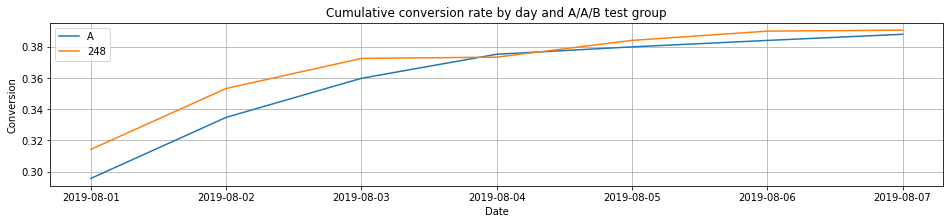

In [128]:
# selecting data on group 246 and group 247 together
cumulativeDataA = cumulativeData[cumulativeData['group']!=248].groupby(by = 'date').agg('sum').reset_index()
cumulativeDataA['conversion'] = cumulativeDataA['payments']/cumulativeDataA['visitors']

# plotting the graphs
plt.figure(figsize=(16, 3))

plt.grid()

plt.plot(cumulativeDataA['date'], cumulativeDataA['conversion'], label='A')
plt.plot(cumulativeData248['date'], cumulativeData248['conversion'], label=248)
plt.legend()

plt.ylabel("Conversion")
plt.xlabel("Date")
plt.title("Cumulative conversion rate by day and A/A/B test group")

plt.show()

To make the difference clearer, let's plot the cummulative difference graph:

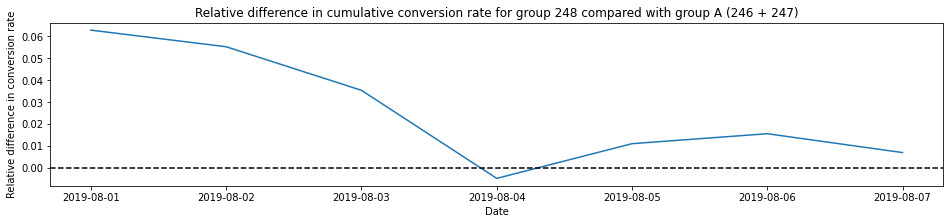

In [129]:
# gathering the data into one DataFrame
mergedCumulativConversion = cumulativeDataA.merge(cumulativeData248,
                                                   left_on='date',
                                                   right_on='date', how='left', suffixes=['A', '248'])

# plotting a relative difference graph for the average purchase sizes
plt.figure(figsize=(16, 3))

plt.plot(mergedCumulativConversion['date'],
         (mergedCumulativConversion['conversion248'])/(mergedCumulativConversion['conversionA'])-1)

# adding the X axis
plt.axhline(y=0, color='black', linestyle='--')

plt.ylabel("Relative difference in conversion rate")
plt.xlabel("Date")
plt.title("Relative difference in cumulative conversion rate for group 248 compared with group A (246 + 247)")

plt.show()

We have already mentioned, that one week is not enough for the experiment and it should have been continued; however, the last plot seems to demonstarte signs of no difference between the control group and the test group.

[Back to Content](#content)

# Conclusions <a id='conclusions'></a>

Our goal was to investigate the user interaction with the app and check the results of one particular A/A/B test. The initial dataset contained data on different types of events, their timestamps, device id's and the number of the experiment group.

At the data pre-processing step:
    
- We have uploaded the data (with the `\t` separator), found and dropped 413 duplicated entries, checked the data for column names, missing values and data types, fixed the column names, fixed the date and time column type and value representation and added the `event_date` column for the purpose of the further analysis.
- We have checked what the time period is covered by the dataset; it turned out that the initial data covers 2 weeks, starting from Jul 25, but the first week represented 1.16% of the data only and seemed to be technical; thus, we have cleaned the dataset and left with a set of 241298 entries for one week, Ayg 1, 2019 to Aug 7, 2019;
- We have learned that there are five types of events in the dataset and 49% of them are main page views;
- Those 241298 events were generated by 7534 devices; we had to assume that the number of devices is a good proxy to the number of users;
- The event distribution is non-normal with 32 events on average for a device, while the median number of the events per device equals 19;
- Appr. 50 users (less than 0.7%) performed more than 70 purchases in the week of the data sample; what seems to deserve additional attention, they generated 11.4% of the total number of events;
- The test group (248) has slightly higher number of devices than the control groups; however, the difference is around 2%. The distribution of the number of events by devices for each group have some minor differences.

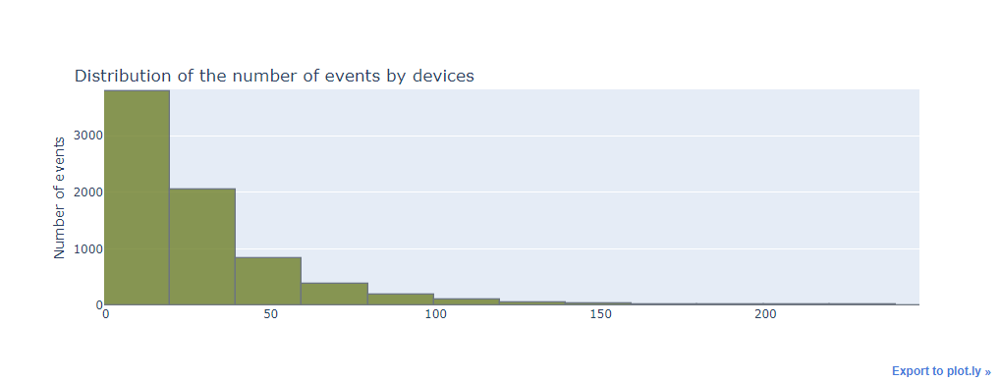

Then, we have analysed the funnel and come up with the following results:




- We have initial analysis of a basic, three-step, funnel and concluded that almost 50% users are lost before moving to the cart, while 95% of those who started building a cart proceeded with the paymnet; close to 48% of users make the entire journey from their first event to payment.;
- Then we have cleaned the `event_log` from those devices that could distort the result with artifacts, like, visiting a cart screen for the first time before entering the main screen for the first time accordingly;
- After cleaning we have singled out from the the `event_log` a subset of those devices (users) who, when interracting with the app for the first time, see an offer screen before they enter a cart screen (22%) and those who either never see an offer screen or enter it after they started to arrange a cart (64%).

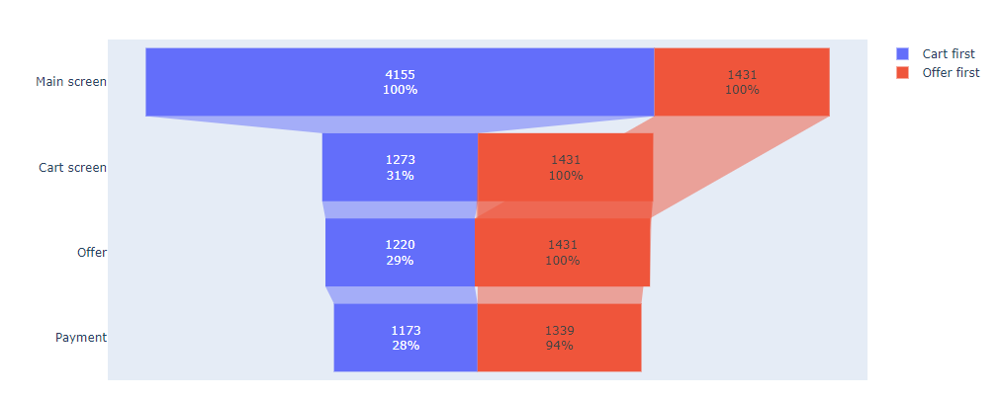

It turned out that 69% of those users, who do not see an offer before starting to arrange a cart become lost; if they see an offer afterwards, 100% of them return and enter the offer screen, and 94% of those who saw the offer screen accomplish the payment step;  only 28% of the initial sample of those who receive it after they start arranging a cart or do not receive at all end up accomplishing a payment.

On the other hand, for those who receive an offer before they start arranging a cart, we lose only 6% at the payment stage: 94% of the initial sample of those receiveing an offer before they start arranging a cart perform the payment.


While studying the results of the experiment, we have:

- Tested the two control group for statistical difference is the proportions of users who performed particular actions and proper split; the two groups should be seen as statistically identical (properly split);
- Tested the difference between the test group (`248`) and the control groups, both in isolation and combined;
- Since the results did not show any significant difference, we decided to study the aggregated cumulative daily values for two event types, main screen visits and payments, to try to clarify the picture;
- The test group showed more visitors, but resulted in an ambiguous results on the conversion rate (for successful payments vs. visits of the main screen); thus, we took a look on the conversion rate for the combined sample of the two control groups and plotted the cummulative difference graph;
- The cummulative difference graph demonstarted signs of no difference between the control group and the test group, though the test should be continued to result untill the plot becomes stabilized.

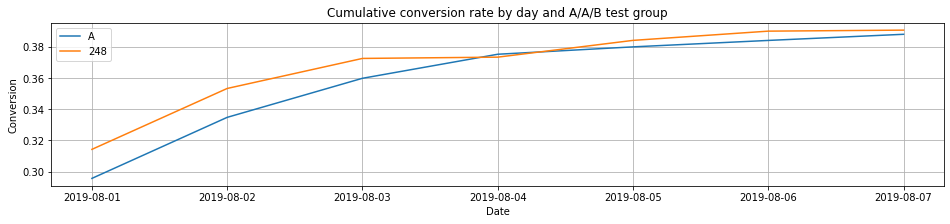

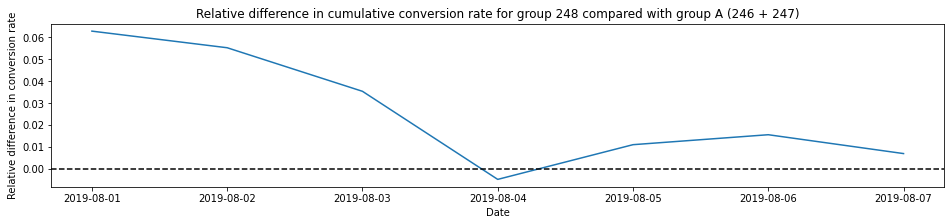


